In [641]:

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt

import time
import json
import requests
import subprocess
import glob
import os

data_path = './data'

BLENDER_PATH = '/Applications/Blender.app/Contents/MacOS/Blender'  # Path to Blender executable
BLENDER_FILE = '/Users/holu/Documents/tinkering/PoseDetection/simulator/blender_data/simulator.blend'  # Path to your Blender file

MMPOSE_IP = '10.1.1.142'
MMPOSE_PORT = 3129


## 📸 Capture Images

In [643]:
# extract images from Blender
# Paths (update these to match your system)
blender_path = '/Applications/Blender.app/Contents/MacOS/Blender'  # Path to Blender executable
blend_file = '/Users/holu/Documents/tinkering/PoseDetection/simulator/blender/simulator.blend'                   # Path to your Blender file
script_path = '/Users/holu/Documents/tinkering/PoseDetection/simulator/capture_camera_view.py'                   # Path to the script we just created

# Command to run
command = [
    BLENDER_PATH,
    BLENDER_FILE,
    '--python', script_path     # Execute the Python script
]

# Execute the command
subprocess.run(command)


Read prefs: /Users/holu/Library/Application Support/Blender/3.4/config/userpref.blend
Reloading external rigs...
Reloading external metarigs...


CAD_Sketcher-main:{INFO}: Logging into: /var/folders/3c/t08nl7456zl9jcq07p2xt7x80000gn/T/CAD_Sketcher-main.log


blenderkit addon: Verbose is enabled
blenderkit addon: Read in JSON settings from file
Read blend: /Users/holu/Documents/tinkering/PoseDetection/simulator/blender_data/simulator.blend
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20241004120237/Camera.000.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20241004120237/Camera.000.png'
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20241004120237/Camera.001.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20241004120237/Camera.001.png'
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20241004120237/Camera.002.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20241004120237/Camera.002.png'
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20241004120237/Camera.003.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/Pose

CompletedProcess(args=['/Applications/Blender.app/Contents/MacOS/Blender', '/Users/holu/Documents/tinkering/PoseDetection/simulator/blender_data/simulator.blend', '--python', '/Users/holu/Documents/tinkering/PoseDetection/simulator/capture_camera_view.py'], returncode=0)

In [644]:
# 🔋 load images

# Get the list of subfolders in the data folder
subfolders = [f.path for f in os.scandir(data_path) if f.is_dir()]

# Get the list of image files in each subfolder
image_files = []
for folder in subfolders:
    image_files.extend(glob.glob(folder + '/*.png'))

# Sort the image files based on their creation time
image_files.sort(key=os.path.getctime)

# Get the last four image files
last_captures = image_files[-4:]

# Load the last captures as image variables
image1 = Image.open(last_captures[0])
image2 = Image.open(last_captures[1])
image3 = Image.open(last_captures[2])
image4 = Image.open(last_captures[3])

# # Create a 2x2 grid of subplots
# fig, axs = plt.subplots(2, 2)
# fig.set_size_inches(10, 8)

# # Plot the images in the subplots
# axs[0, 0].imshow(image1)
# axs[0, 0].set_title('Image 1')
# axs[0, 1].imshow(image2)
# axs[0, 1].set_title('Image 2')
# axs[1, 0].imshow(image3)
# axs[1, 0].set_title('Image 3')
# axs[1, 1].imshow(image4)
# axs[1, 1].set_title('Image 4')

# # Remove the axis labels
# for ax in axs.flat:
#     ax.set(xticks=[], yticks=[])
#     ax.margins(0.05)

# # Display the grid of images
# plt.show()

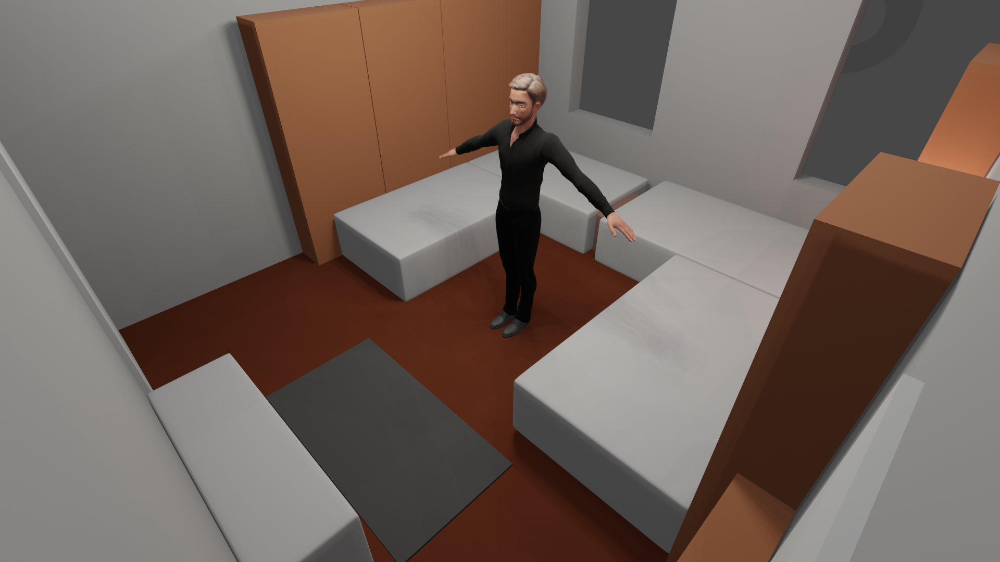

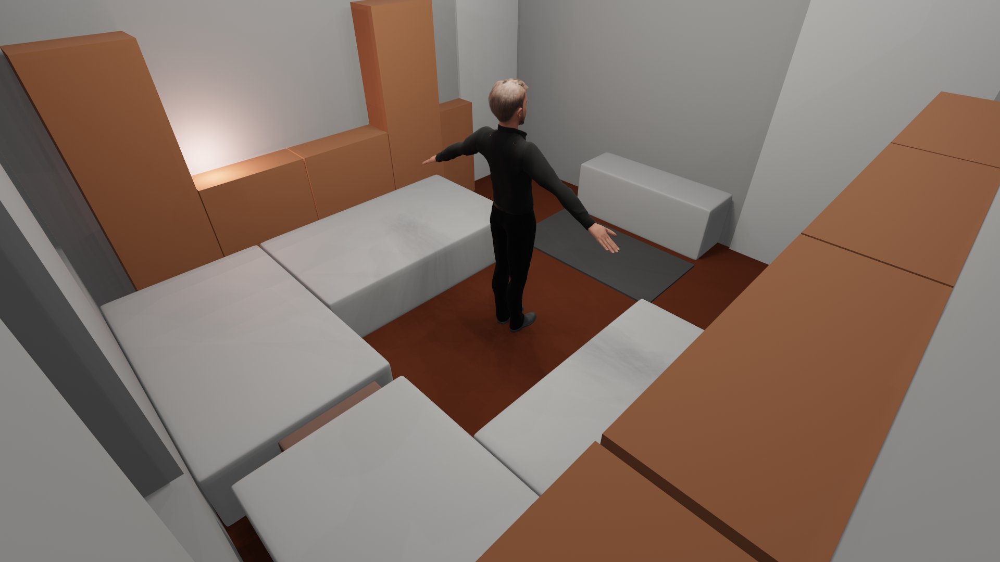

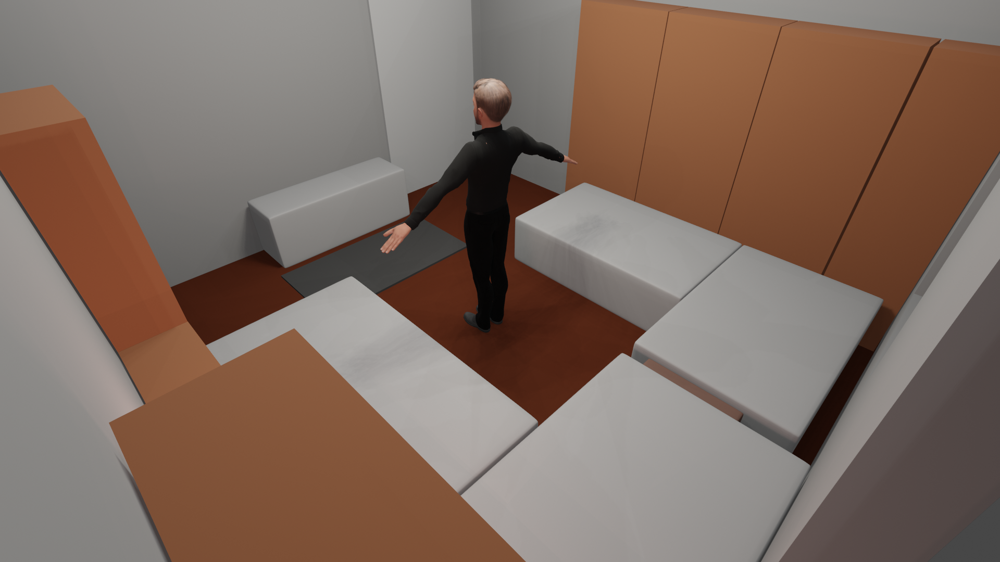

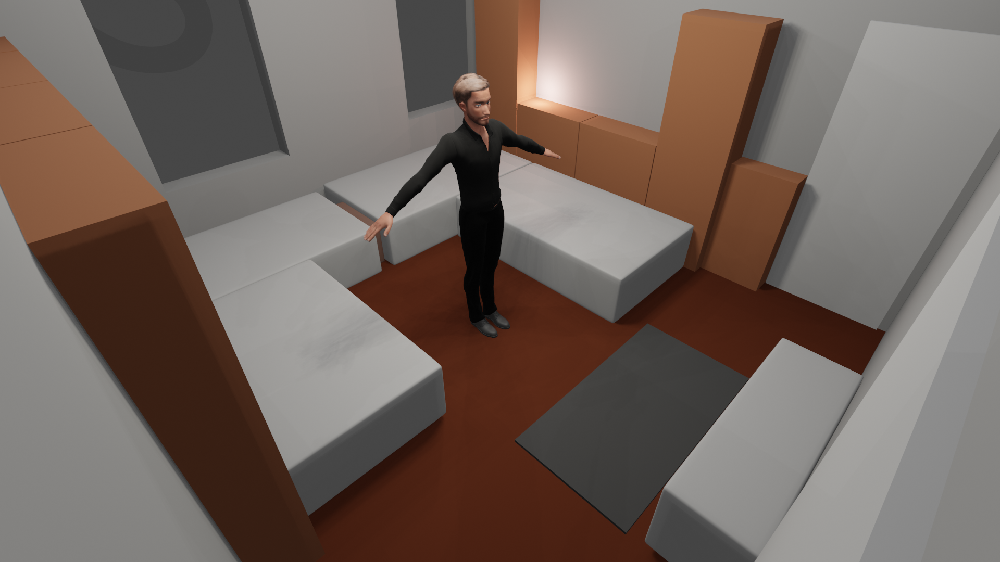

In [645]:
# 🌁display and buffer current images for further processing
images = [image1, image2, image3, image4]
for image in images:
    display(image)

## Pose Detection

In [134]:
import mediapipe as mp
import cv2
import numpy as np

mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

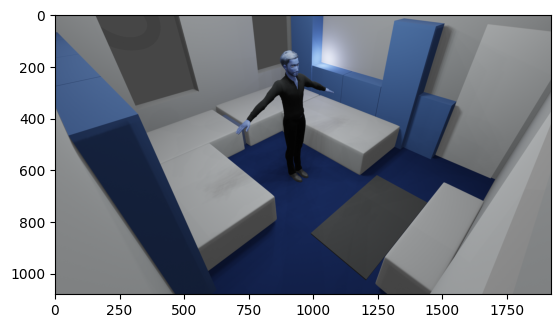

In [546]:
# experiment = '20240924140604'
experiment = '20240924161537'
experiment = '20240924161930' # single person detection
experiment = '20240926132814' # multi-person detection
experiment = '20241002224128' # turned-person detection
selected_camera = 'Camera.003'
test_image_path = glob.glob(data_path + f'/{experiment}/{selected_camera}.png')[0]
test_image = cv2.imread(test_image_path)
plt.imshow(test_image)

In [547]:
# build test images
# test_case_type = 'multi_person'
# test_case_type = 'single_person'
test_case_type = 'turned_person'

if test_case_type == 'single_person':
    experiment = '20240924140604'
elif test_case_type == 'multi_person':
    experiment = '20240926132814'
elif test_case_type == 'turned_person':
    experiment = '20241002224128'
elif test_case_type == 'manual':
    experiment = '20241002225934'
else:
    raise ValueError('Invalid test case type')

test_images = []
# get all images in the experiment folder and load them as PIL image
experiment_images = glob.glob(data_path + f'/{experiment}/*.png')
for image_path in experiment_images:
    test_image = Image.open(image_path)
    test_images.append(test_image)
    

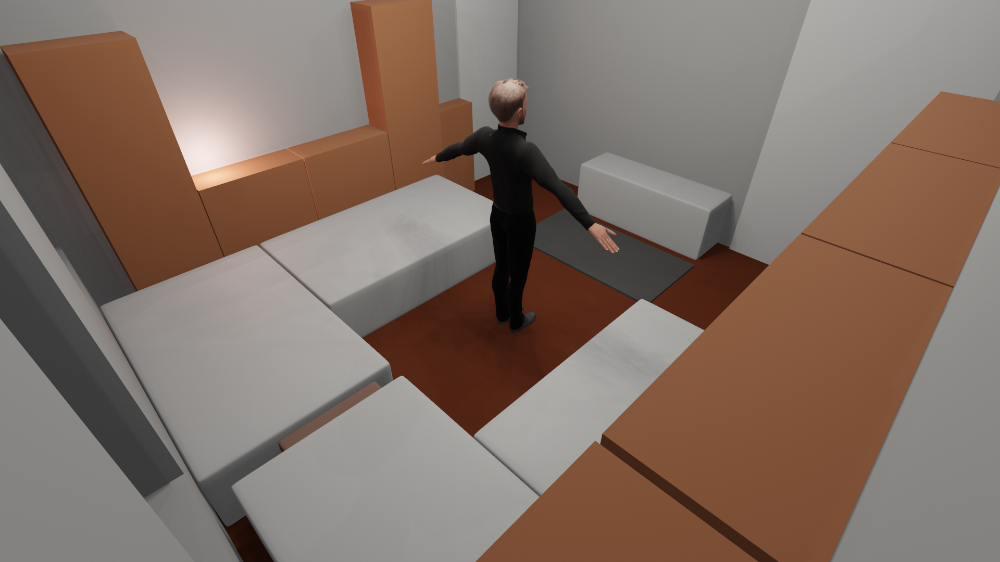

In [552]:
test_images[0]

### Mediapipe


I0000 00:00:1727350959.260562 6704704 gl_context.cc:357] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M1
W0000 00:00:1727350959.338925 7359004 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1727350959.366349 7359004 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


#PoseDetections: 1


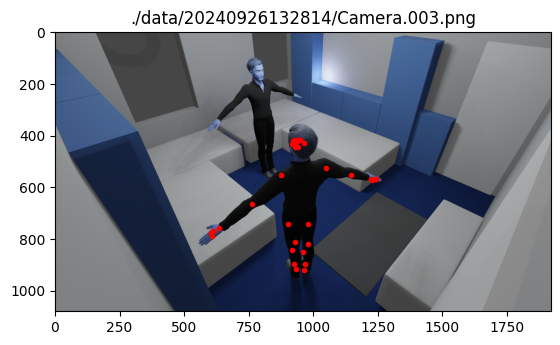

In [170]:
# https://github.com/google-ai-edge/mediapipe-samples/blob/main/examples/pose_landmarker/python/%5BMediaPipe_Python_Tasks%5D_Pose_Landmarker.ipynb
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# STEP 2: Create an PoseLandmarker object.
base_options = python.BaseOptions(model_asset_path='pose_landmarker.task')
options = vision.PoseLandmarkerOptions(
    base_options=base_options,
    num_poses=4,
    min_pose_detection_confidence=0.2, #[0, 1]
    min_pose_presence_confidence=0.2, #[0, 1]
    min_tracking_confidence=0.2, #[0, 1]
    # result_callback=print_result
    output_segmentation_masks=True,
)
detector = vision.PoseLandmarker.create_from_options(options)

# STEP 3: Load the input image.
image = mp.Image.create_from_file(test_image_path)

# STEP 4: Detect pose landmarks from the input image.
detection_result = detector.detect(image)
print("#PoseDetections:", len(detection_result.pose_landmarks))

# show the test_image with the landmarks
x,y,_ = test_image.shape
fig = plt.figure()
ax = fig.add_subplot(111)
ax.title.set_text(test_image_path)
ax.imshow(test_image)
colors = ['r', 'g', 'b', 'y']
for i, pose_landmarks in enumerate(detection_result.pose_landmarks):
    for landmark in pose_landmarks:
        ax.plot(landmark.x * y, landmark.y * x, colors[i % len(colors)] + '.')
plt.show()



In [152]:
len(detection_result.pose_landmarks)

2

### mmPose - self hosted on homeBase

#### Upload Images

In [553]:
# upload test_case to server
# input:
    # list(image_data)
# return:
    # list[
    #   PoseLandmarks(
    #       list(float)
    #   )
    # )]

# send images to server
# extract keypoints for poses on return
def upload_images_to_server(images: list):
    assert images is not None, "There are no images to process"
    assert len(images) > 0, "There are no images to process"
    for image in images:
        assert isinstance(image, Image.Image), "Each image in the 'images' list must be of type PIL image"

    import requests
    from io import BytesIO

    url = f'http://{MMPOSE_IP}:{MMPOSE_PORT}/upload'  # Update the URL if running on a different host or port

    files = []

    for idx, img in enumerate(images):
        img_io = BytesIO()
        img.save(img_io, format='PNG')
        img_io.seek(0)
        # The filename doesn't affect the saved name on the server, but we'll use it anyway
        files.append(('images', (f'Camera.{idx:03d}.png', img_io, 'image/png')))

    response = requests.post(url, files=files)

    if response.status_code == 200:
        print(f'[INFO] ImageUpload@{MMPOSE_IP}:{MMPOSE_PORT}')
        global last_upload
        last_upload = dt.datetime.now()
        print(f'[INFO] last upload at {last_upload}')
    else:
        print('Error:', response.text)
    return response


images = test_images
upload_response = upload_images_to_server(images)
print('ResponseCode:', upload_response.status_code)
print(json.dumps(upload_response.json(), indent=2))


[INFO] ImageUpload@10.1.1.142:3129
[INFO] last upload at 2024-10-02 22:43:30.196476
ResponseCode: 200
{
  "info": {
    "last_access": "2024-10-02T22:43:30.347564",
    "state": "new",
    "upload_time": "2024-10-02T22:43:30.347564",
    "uuid": "f7aaa8a7-c911-419b-af6e-6f0d2a0fc7c1"
  },
  "paths": [
    "uploads\\Camera.000.png",
    "uploads\\Camera.001.png",
    "uploads\\Camera.002.png",
    "uploads\\Camera.003.png"
  ]
}


#### Process Uploaded Images

In [554]:
import requests

assert last_upload is not None, "No images have been uploaded to the server yet"

# Define the endpoint URL
url = f"http://{MMPOSE_IP}:{MMPOSE_PORT}/process"

# Define the payload for the POST request
payload = {
    "action": "continue"
}

# Send the POST request
response = requests.post(url, json=payload)
process_response = response

# Check the response status code
if process_response.status_code == 200:
    process_response_json = response.json()
    process_response_info = process_response_json["data"]["upload_state"]
    process_response_data = process_response_json["data"]['results']
    print(json.dumps(process_response_info, indent=2))
    for res, valiues in process_response_data.items():
        print(res)
        print(json.dumps(json.loads(valiues), indent=2))
else:
    print("Failed to send action")
    print(response)

{
  "last_access": "2024-10-02T22:43:37.194997",
  "state": "finished",
  "upload_time": "2024-10-02T22:43:30.347564",
  "uuid": "f7aaa8a7-c911-419b-af6e-6f0d2a0fc7c1"
}
Camera.000.png
[
  {
    "keypoints": [
      [
        1011.8076782226562,
        204.02395629882812
      ],
      [
        1009.3192749023438,
        197.80300903320312
      ],
      [
        1009.3192749023438,
        196.55882263183594
      ],
      [
        950.8424072265625,
        211.4890899658203
      ],
      [
        998.12158203125,
        211.4890899658203
      ],
      [
        928.447021484375,
        262.5008544921875
      ],
      [
        1010.5634765625,
        286.1404724121094
      ],
      [
        879.923583984375,
        287.3846435546875
      ],
      [
        1072.77294921875,
        363.28021240234375
      ],
      [
        842.597900390625,
        302.3149108886719
      ],
      [
        1131.2498779296875,
        429.22222900390625
      ],
      [
        958

In [555]:
print(upload_response.json()['info']['uuid'], "<- upload uuid")
print(process_response_info['uuid'], "<- process uuid")
for res in process_response_data.keys():
    print("\t",res)


f7aaa8a7-c911-419b-af6e-6f0d2a0fc7c1 <- upload uuid
f7aaa8a7-c911-419b-af6e-6f0d2a0fc7c1 <- process uuid
	 Camera.000.png
	 Camera.001.png
	 Camera.002.png
	 Camera.003.png


In [556]:
# itterate over cameras (keys) and extract keypoint-groups
for camera in process_response_data.keys():
    print(camera)
    data = json.loads(process_response_data[camera])
    for idx, pose in enumerate(data):
        print(f'Pose {idx+1}: head: {pose["keypoints"][0]}')


Camera.000.png
Pose 1: head: [1011.8076782226562, 204.02395629882812]
Camera.001.png
Pose 1: head: [987.2036743164062, 208.7794189453125]
Camera.002.png
Pose 1: head: [908.6475219726562, 204.47860717773438]
Camera.003.png
Pose 1: head: [934.2650756835938, 209.47244262695312]


## save experiment data

In [557]:
experiments_path = './experiments'
os.makedirs(experiments_path, exist_ok=True)

def save_experiment_data(experiment_name, images, detection_data):
    experiment_slak = experiment_name.replace(':', '_').replace(' ', '_')
    experiment_path = f'{experiments_path}/{experiment_slak}'
    os.makedirs(experiment_path, exist_ok=False)
    for idx, image in enumerate(images):
        image.save(f'{experiment_path}/Camera.{idx:03d}.png')
    with open(f'{experiment_path}/detection_data.json', 'w') as f:
        json.dump(detection_data, f, indent=2)

In [558]:
process_response_data_cleaned = {}
for k, v in process_response_data.items():
    print(k)
    print(json.loads(v))
    process_response_data_cleaned[k] = json.loads(v)[0]

Camera.000.png
[{'keypoints': [[1011.8076782226562, 204.02395629882812], [1009.3192749023438, 197.80300903320312], [1009.3192749023438, 196.55882263183594], [950.8424072265625, 211.4890899658203], [998.12158203125, 211.4890899658203], [928.447021484375, 262.5008544921875], [1010.5634765625, 286.1404724121094], [879.923583984375, 287.3846435546875], [1072.77294921875, 363.28021240234375], [842.597900390625, 302.3149108886719], [1131.2498779296875, 429.22222900390625], [958.3075561523438, 420.5129089355469], [998.12158203125, 426.7338562011719], [963.2843017578125, 515.0712890625], [994.3890380859375, 526.2689819335938], [963.2843017578125, 589.72265625], [990.6564331054688, 614.6064453125]], 'keypoint_scores': [0.922717809677124, 0.6701399683952332, 0.9488722681999207, 0.6285002827644348, 0.9816393852233887, 0.8269492983818054, 0.7845406532287598, 0.8337188959121704, 0.7944217324256897, 0.8804937601089478, 0.875118613243103, 0.7288313508033752, 0.7484992146492004, 0.8135354518890381, 0.

In [559]:
process_response_info

{'last_access': '2024-10-02T22:43:37.194997',
 'state': 'finished',
 'upload_time': '2024-10-02T22:43:30.347564',
 'uuid': 'f7aaa8a7-c911-419b-af6e-6f0d2a0fc7c1'}

In [560]:
process_response_data

{'Camera.000.png': '[\n    {\n        "keypoints": [\n            [\n                1011.8076782226562,\n                204.02395629882812\n            ],\n            [\n                1009.3192749023438,\n                197.80300903320312\n            ],\n            [\n                1009.3192749023438,\n                196.55882263183594\n            ],\n            [\n                950.8424072265625,\n                211.4890899658203\n            ],\n            [\n                998.12158203125,\n                211.4890899658203\n            ],\n            [\n                928.447021484375,\n                262.5008544921875\n            ],\n            [\n                1010.5634765625,\n                286.1404724121094\n            ],\n            [\n                879.923583984375,\n                287.3846435546875\n            ],\n            [\n                1072.77294921875,\n                363.28021240234375\n            ],\n            [\n             

In [561]:
experiment_name = "manual-detection"
process_response_info_extended = process_response_info.copy()
process_response_info_extended['experiment_number'] = experiment
process_response_info_extended['experiment_name'] = experiment_name
process_response_info_extended

{'last_access': '2024-10-02T22:43:37.194997',
 'state': 'finished',
 'upload_time': '2024-10-02T22:43:30.347564',
 'uuid': 'f7aaa8a7-c911-419b-af6e-6f0d2a0fc7c1',
 'experiment_number': '20241002224128',
 'experiment_name': 'turned-person-detection'}

In [589]:
save_experiment_data(
    experiment_name, 
    test_images, 
    {
        "info": process_response_info_extended,
        "data": process_response_data_cleaned
    })

## Reconstruct the Pose in 3D

In [ ]:
# TODO: get camera positions and rotations from blender file
# TODO: load data from saved experiment

### extract camera parameters

In [563]:
## STEP 1: Extract Camera Parameters
import subprocess

script_path = '/Users/holu/Documents/tinkering/PoseDetection/simulator/extract_camera_parameters.py'  # Path to the script we just created

# Command to run
command = [
    BLENDER_PATH,
    BLENDER_FILE,
    '--python', script_path    # Execute the Python script
]

# Execute the command
subprocess.run(command)


Read prefs: /Users/holu/Library/Application Support/Blender/3.4/config/userpref.blend
Reloading external rigs...
Reloading external metarigs...


CAD_Sketcher-main:{INFO}: Logging into: /var/folders/3c/t08nl7456zl9jcq07p2xt7x80000gn/T/CAD_Sketcher-main.log


blenderkit addon: Verbose is enabled
blenderkit addon: Read in JSON settings from file
Read blend: /Users/holu/Documents/tinkering/PoseDetection/simulator/simulator.blend
Camera parameters have been saved to /Users/holu/Documents/tinkering/PoseDetection/simulator/experiments/camera-example-parameters/camera_parameters_20241002224442.json
Saved session recovery to '/var/folders/3c/t08nl7456zl9jcq07p2xt7x80000gn/T/quit.blend'
blenderkit INFO: Unregistering BlenderKit add-on [22:44:42.603, __init__.py:2412]
blenderkit INFO: Reported Blender quit to daemon [22:44:42.610, __init__.py:2433]


CompletedProcess(args=['/Applications/Blender.app/Contents/MacOS/Blender', '/Users/holu/Documents/tinkering/PoseDetection/simulator/simulator.blend', '--python', '/Users/holu/Documents/tinkering/PoseDetection/simulator/extract_camera_parameters.py'], returncode=0)

In [590]:
# camera_parameters_example_path = 'experiments/camera-example-parameters/camera_parameters_20241002131616.json'
camera_parameters_example_path = 'experiments/turned-person-detection/camera_parameters.json'
camera_parameters_example_path = 'experiments/manual-detection/camera_parameters.json'

with open(camera_parameters_example_path, 'r') as f:
    cameras_parameters = json.load(f)


In [591]:
cameras_parameters

[{'name': 'Camera.000',
  'intrinsic': {'focal_length_mm': 18.0,
   'sensor_width_mm': 36.0,
   'sensor_height_mm': 24.0,
   'resolution_x_px': 1920,
   'resolution_y_px': 1080,
   'pixel_aspect_ratio': 1.0,
   'principal_point_px': [960.0, 540.0],
   'focal_length_x_px': 960.0,
   'focal_length_y_px': 960.0,
   'intrinsic_matrix': [[960.0, 0, 960.0], [0, 960.0, 540.0], [0, 0, 1]]},
  'extrinsic': {'location': [-2.007873296737671,
    2.1570141315460205,
    2.6291472911834717],
   'rotation_euler_xyz_deg': [52.99999692139992, -0.0, -135.00000034162267],
   'rotation_matrix': [[-0.7091192603111267,
     0.4138108789920807,
     -0.562910795211792],
    [-0.7091192603111267, -0.4138108789920807, 0.562910795211792],
    [0.0, 0.7766091823577881, 0.599886417388916]]}},
 {'name': 'Camera.001',
  'intrinsic': {'focal_length_mm': 18.0,
   'sensor_width_mm': 36.0,
   'sensor_height_mm': 24.0,
   'resolution_x_px': 1920,
   'resolution_y_px': 1080,
   'pixel_aspect_ratio': 1.0,
   'principal_p

### Build Camera Model

In [592]:
import numpy as np

class Camera:
    def __init__(self, name, intrinsic_params, extrinsic_params):
        self.name = name
        
        # Intrinsic Parameters
        self.focal_length_mm = intrinsic_params['focal_length_mm']
        self.sensor_width_mm = intrinsic_params['sensor_width_mm']
        self.sensor_height_mm = intrinsic_params['sensor_height_mm']
        self.resolution_x_px = intrinsic_params['resolution_x_px']
        self.resolution_y_px = intrinsic_params['resolution_y_px']
        self.pixel_aspect_ratio = intrinsic_params['pixel_aspect_ratio']
        self.principal_point_px = intrinsic_params['principal_point_px']
        self.focal_length_x_px = intrinsic_params['focal_length_x_px']
        self.focal_length_y_px = intrinsic_params['focal_length_y_px']
        self.K = np.array(intrinsic_params['intrinsic_matrix'])
        
        # Extrinsic Parameters
        self.location = np.array(extrinsic_params['location'])  # Translation vector
        self.rotation_euler_deg = np.array(extrinsic_params['rotation_euler_xyz_deg'])
        self.rotation_matrix = np.array(extrinsic_params['rotation_matrix'])
        
        # Convert rotation matrix to 3x3 numpy array if it's a list of lists
        if self.rotation_matrix.shape != (3, 3):
            self.rotation_matrix = np.array(self.rotation_matrix).reshape(3, 3)
        
        # Calculate the camera projection matrix
        self.P = self.calculate_projection_matrix()
    
    def calculate_projection_matrix(self):
        # Transpose of R to get rotation from world to camera coordinates
        R_world_to_camera = self.rotation_matrix.T
        # Compute translation vector t = -R * C
        t = -R_world_to_camera @ self.location.reshape(3, 1)
        # Form the extrinsic matrix [R | t]
        RT = np.hstack((R_world_to_camera, t))
        # Compute the projection matrix
        P = self.K @ RT
        return P



In [567]:
# initialize cameras
cameras = []

for cam_params in cameras_parameters:
    name = cam_params['name']
    intrinsic = cam_params['intrinsic']
    extrinsic = cam_params['extrinsic']
    
    # Create a Camera instance
    camera = Camera(name, intrinsic, extrinsic)
    cameras.append(camera)
    
    # Optional: Print camera details to verify
    print(f"Initialized Camera: {camera.name}")
    print(f"Projection Matrix P:\n{camera.P}\n")


Initialized Camera: Camera.000
Projection Matrix P:
[[-1.22114885e+03 -1.40360126e+02  5.75890961e+02 -3.66325556e+03]
 [ 9.32866144e+01 -9.32866144e+01  1.06948348e+03 -2.42330135e+03]
 [-5.62910795e-01  5.62910795e-01  5.99886417e-01 -3.92164984e+00]]

Initialized Camera: Camera.001
Projection Matrix P:
[[ 1.22114885e+03  1.40360241e+02  5.75890914e+02 -3.66325507e+03]
 [-9.32866073e+01  9.32865894e+01  1.06948345e+03 -2.42330180e+03]
 [ 5.62910914e-01 -5.62910736e-01  5.99886358e-01 -3.92165035e+00]]

Initialized Camera: Camera.002
Projection Matrix P:
[[ 1.40360126e+02 -1.22114885e+03  5.75890903e+02 -3.86631257e+03]
 [ 9.32866144e+01  9.32866144e+01  1.06948345e+03 -2.42330122e+03]
 [-5.62910795e-01 -5.62910795e-01  5.99886358e-01 -3.92164996e+00]]

Initialized Camera: Camera.003
Projection Matrix P:
[[-1.40360126e+02  1.22114885e+03  5.75890961e+02 -3.86631214e+03]
 [-9.32866144e+01 -9.32866144e+01  1.06948348e+03 -2.42330135e+03]
 [ 5.62910795e-01  5.62910795e-01  5.99886417e-01

In [593]:
for cam in cameras:
    print(cam.name)
    print(cam.location)
    print(cam.rotation_euler_deg)

Camera.000
[-2.0078733   2.15701413  2.62914729]
[  52.99999692   -0.         -135.00000034]
Camera.001
[ 2.00787306 -2.15701485  2.62914777]
[ 5.30000003e+01 -6.33026154e-07  4.50000081e+01]
Camera.002
[-2.0078733  -2.15701461  2.62914729]
[ 52.99999692  -0.         -45.00000125]
Camera.003
[2.0078733  2.15701413 2.62914729]
[ 52.99999692  -0.         135.00000034]


### Visualization

In [594]:
def plot_camera(ax, camera, scale=0.5, color='blue'):
    """
    Plots a camera in 3D space.

    Parameters:
    - ax: Matplotlib 3D axis
    - camera: Camera object
    - scale: Scale for the camera size
    - color: Color of the camera frustum
    """
    # Camera center
    C = camera.location

    # Camera orientation (rotation matrix)
    R = camera.rotation_matrix

    # Define the image plane in camera coordinate system
    # Let's define a rectangle at Z = 1 (arbitrary distance)
    w = camera.resolution_x_px
    h = camera.resolution_y_px

    # Normalize width and height based on scale
    w_scaled = scale * w / max(w, h)
    h_scaled = scale * h / max(w, h)

    # Image plane corners in camera coordinates
    image_plane_corners = np.array([
        [-w_scaled / 2, -h_scaled / 2, -1],  # Bottom-left
        [w_scaled / 2, -h_scaled / 2, -1],   # Bottom-right
        [w_scaled / 2, h_scaled / 2, -1],    # Top-right
        [-w_scaled / 2, h_scaled / 2, -1],   # Top-left
    ]).T  # Shape: (3, 4)

    # Transform image plane corners to world coordinates
    image_plane_world = (R @ image_plane_corners) + C.reshape(3, 1)

    # Draw the camera center
    ax.scatter(C[0], C[1], C[2], color=color, marker='o')

    # Draw lines from camera center to image plane corners (frustum edges)
    for i in range(4):
        corner = image_plane_world[:, i]
        ax.plot([C[0], corner[0]], [C[1], corner[1]], [C[2], corner[2]], color=color)

    # Draw the image plane as a rectangle
    # Close the loop by repeating the first corner at the end
    corners = np.hstack((image_plane_world, image_plane_world[:, [0]]))
    ax.plot(corners[0, :], corners[1, :], corners[2, :], color=color)


In [595]:
def backproject_keypoints(camera, keypoints):
    rays = []
    K_inv = np.linalg.inv(camera.K)
    R = camera.rotation_matrix
    C = camera.location.reshape(3, 1)
    
    for kp in keypoints:
        u, v = kp
        # Create homogeneous image coordinate
        uv1 = np.array([u, v, 1]).reshape(3, 1)
        
        # Back-project to normalized camera coordinates
        xyz_camera = K_inv @ uv1
        
        # Transform direction to world coordinates
        direction_world = -R @ xyz_camera
        direction_world = direction_world / np.linalg.norm(direction_world)
        
        # Ray starts at camera center, extends in the direction
        ray = {'origin': C.flatten(), 'direction': direction_world.flatten()}
        rays.append(ray)
    return rays

In [596]:
# build artificial keypoints
# Define image dimensions (from camera intrinsic parameters)
image_width = cameras[0].resolution_x_px
image_height = cameras[0].resolution_y_px

# Define keypoints in pixel coordinates
# Center of the image
center_keypoint = (image_width / 2, image_height / 2)

# Corners of the image
top_left = (0, 0)
top_right = (image_width, 0)
bottom_left = (0, image_height)
bottom_right = (image_width, image_height)

# Collect keypoints
keypoints = [center_keypoint, top_left, top_right, bottom_left, bottom_right]
keypoints

[(960.0, 540.0), (0, 0), (1920, 0), (0, 1080), (1920, 1080)]

In [597]:
def build_artificial_keypoints(cameras):
    # build artificial keypoints
    # Define image dimensions (from camera intrinsic parameters)
    image_width = cameras[0].resolution_x_px
    image_height = cameras[0].resolution_y_px

    # Define keypoints in pixel coordinates
    # Center of the image
    center_keypoint = (image_width / 2, image_height / 2)

    # Corners of the image
    top_left = (0, 0)
    top_right = (image_width, 0)
    bottom_left = (0, image_height)
    bottom_right = (image_width, image_height)

    # Collect keypoints
    keypoints = []
    keypoints.extend([center_keypoint])
    # keypoints.extend([top_left, top_right, bottom_left, bottom_right])
    return keypoints

artificial_keypoints = build_artificial_keypoints(cameras) 

In [605]:
with open('experiments/manual-detection/detection_data.json', 'r') as f:
    detection_data = json.load(f)
detection_data['data']

{'Camera.000.png': {'keypoints': [[993.0, 264.0]],
  'keypoint_scores': [1.0],
  'bbox': [[808.25830078125,
    149.05755615234375,
    1190.4732666015625,
    637.2239379882812]],
  'bbox_score': 1.0},
 'Camera.001.png': {'keypoints': [[993.0, 264.0]],
  'keypoint_scores': [1.0],
  'bbox': [[840.0338745117188,
    139.43101501464844,
    1221.3697509765625,
    648.4830322265625]],
  'bbox_score': 1.0},
 'Camera.002.png': {'keypoints': [[926.0, 264.0]],
  'keypoint_scores': [1.0],
  'bbox': [[729.266845703125,
    148.23837280273438,
    1113.0115966796875,
    637.9678955078125]],
  'bbox_score': 1.0},
 'Camera.003.png': {'keypoints': [[927.0, 264.0]],
  'keypoint_scores': [1.0],
  'bbox': [[699.6558227539062,
    140.120849609375,
    1079.3883056640625,
    649.1964111328125]],
  'bbox_score': 1.0}}

In [627]:
keypoints_per_camera = []
# List of camera image filenames
camera_image_filenames = [
    'Camera.000.png',
    'Camera.001.png',
    'Camera.002.png',
    'Camera.003.png'
]
for filename in camera_image_filenames:
    keypoints = process_response_data_cleaned[filename]['keypoints']
    # keypoints = detection_data['data'][filename]['keypoints']
    # Get the 0th keypoint
    if False:
        kp0 = keypoints[0]
        keypoints_per_camera.append([kp0])  # Wrap in a list for compatibility
    # Use all keypoints
    else:
        keypoints_per_camera.append(keypoints)  # Each element is a list of keypoints for a camera


In [632]:
keypoints_per_camera

[[[1011.8076782226562, 204.02395629882812],
  [1009.3192749023438, 197.80300903320312],
  [1009.3192749023438, 196.55882263183594],
  [950.8424072265625, 211.4890899658203],
  [998.12158203125, 211.4890899658203],
  [928.447021484375, 262.5008544921875],
  [1010.5634765625, 286.1404724121094],
  [879.923583984375, 287.3846435546875],
  [1072.77294921875, 363.28021240234375],
  [842.597900390625, 302.3149108886719],
  [1131.2498779296875, 429.22222900390625],
  [958.3075561523438, 420.5129089355469],
  [998.12158203125, 426.7338562011719],
  [963.2843017578125, 515.0712890625],
  [994.3890380859375, 526.2689819335938],
  [963.2843017578125, 589.72265625],
  [990.6564331054688, 614.6064453125]],
 [[987.2036743164062, 208.7794189453125],
  [1002.1173095703125, 200.07980346679688],
  [983.4752807617188, 195.1085968017578],
  [1031.944580078125, 203.80821228027344],
  [979.7468872070312, 196.3513946533203],
  [1053.072265625, 272.162353515625],
  [964.833251953125, 249.7919158935547],
  [11

In [633]:
# Define the known 3D point in homogeneous coordinates
X_world = np.array([0, 0, 0, 1])  # (X, Y, Z, 1)

projected_keypoints = []  # To store the projected 2D points for each camera

for cam in cameras:
    P = cam.P  # Camera's projection matrix (3x4)
    x_proj = P @ X_world  # Project the 3D point
    x_proj /= x_proj[2]   # Normalize to get pixel coordinates
    u, v = x_proj[0], x_proj[1]
    projected_keypoints.append((u, v))
    # print(f"Camera {cam.name}: Projected point (u, v) = ({u}, {v})")
display(projected_keypoints)

# Since we have only one keypoint per camera, we wrap it in a list
known_keypoints_per_camera = [[(u, v)] for (u, v) in projected_keypoints]


[(np.float64(934.1108214720343), np.float64(617.9290463650182)),
 (np.float64(934.1105763468696), np.float64(617.9290807840621)),
 (np.float64(985.8892605641055), np.float64(617.9289958421922)),
 (np.float64(985.8891785279657), np.float64(617.9290463650182))]

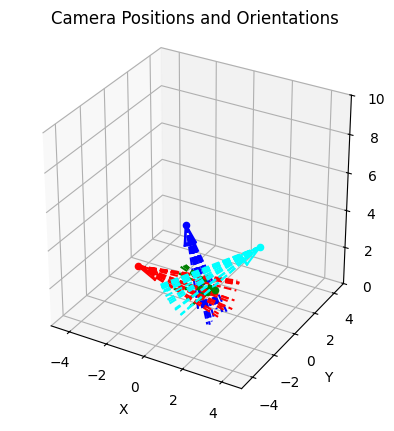

In [634]:
# Colors for different cameras
camera_colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow']

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Initialize the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

all_points = []
# all_points.append(X_world.tolist()[0:3])
all_rays = []

# For each camera, plot the camera and the rays
for idx, camera in enumerate(cameras):
    color = camera_colors[idx % len(camera_colors)]
    plot_camera(ax, camera, scale=0.5, color=color)
    
    actual_keypoints = keypoints_per_camera[idx]
    known_keypoints = known_keypoints_per_camera[idx]

    # Back-project keypoints to obtain rays
    known_rays = backproject_keypoints(camera, known_keypoints)
    debug_rays = backproject_keypoints(camera, artificial_keypoints)
    actual_rays = backproject_keypoints(camera, actual_keypoints)
    
    rays = []
    # rays.extend(debug_rays)
    # rays.extend(known_rays)
    rays.extend(actual_rays)

    # Plot rays
    for ray in rays:
        origin = ray['origin']
        direction = ray['direction']
        # Define the length of the ray for visualization
        length = 5  # Adjust as needed
        end_point = origin + direction * length
        ax.plot([origin[0], end_point[0]],
                [origin[1], end_point[1]],
                [origin[2], end_point[2]],
                color=color, linestyle='--')
    
    all_rays.extend(rays)
    all_points.extend([ray['origin'] for ray in rays])

# Set plot labels
ax.set_xlabel('X')
ax.set_xlim(-5, 5)
ax.set_ylabel('Y')
ax.set_ylim(-5, 5)
ax.set_zlabel('Z')
ax.set_zlim(0, 10)
ax.set_title('Camera Positions and Orientations')

# Equal aspect ratio for all axes
ax.set_box_aspect([1,1,1])

# Show the plot
plt.show()

In [639]:
## STEP 4: triangulating keypoints
def triangulate_points(cameras, keypoints_per_camera):
    """
    cameras: list of Camera objects
    keypoints_per_camera: list of lists, where each sublist contains keypoints for a camera
    """
    num_keypoints = len(keypoints_per_camera[0])
    points_3d = []

    for i in range(num_keypoints):
        A = []
        for cam_idx, cam in enumerate(cameras):
            P = cam.P
            u, v = keypoints_per_camera[cam_idx][i]
            # Formulate equations
            X_row = u * P[2, :] - P[0, :]
            Y_row = v * P[2, :] - P[1, :]
            A.append(X_row)
            A.append(Y_row)
        A = np.array(A)
        # Solve for X using SVD
        U, S, Vt = np.linalg.svd(A)
        X = Vt[-1]
        X = X / X[-1]  # Homogeneous to Cartesian coordinates
        points_3d.append(X[:3])
    return points_3d

times = []
# Triangulate the keypoints
for i in range(0,100):
    start_time = time.time()
    triangulated_points = triangulate_points(cameras, keypoints_per_camera)
    end_time = time.time()
    times.append(end_time - start_time)

print(f"Average time taken for triangulation: {np.mean(times):.6f} seconds")


Average time taken for triangulation: 0.001653 seconds


In [637]:
triangulated_points

[array([ 5.10991183e-02, -9.27493078e-04,  1.73399647e+00]),
 array([ 0.03212129, -0.01909963,  1.76333076]),
 array([0.03171059, 0.02011449, 1.76422227]),
 array([-0.06594323, -0.10417676,  1.73102609]),
 array([-0.0685219 ,  0.10501256,  1.73054488]),
 array([-0.08693258, -0.19151549,  1.53717595]),
 array([-0.08428043,  0.18845039,  1.53557145]),
 array([-0.09003767, -0.45336698,  1.37913163]),
 array([-0.09233981,  0.45261756,  1.37949076]),
 array([-0.08556759, -0.69703534,  1.2504741 ]),
 array([-0.09254377,  0.6969586 ,  1.25124211]),
 array([-0.03526851, -0.09617432,  0.98886717]),
 array([-0.03895672,  0.09278355,  0.98895059]),
 array([-0.03645003, -0.07843381,  0.55653324]),
 array([-0.03728889,  0.07740701,  0.55416789]),
 array([-0.03518272, -0.08441066,  0.11069715]),
 array([-0.03919672,  0.07946056,  0.1036005 ])]

In [638]:
import json

def export_points_and_rays(points, rays, filename):
    data = {
        "points": points,
        "rays": rays
    }
    
    with open(filename, 'w') as f:
        json.dump(data, f, indent=2)

def convert_points_to_list_if_needed(point):
    if isinstance(point, np.ndarray):
        return point.tolist()
    return point

prepared_points = [convert_points_to_list_if_needed(point) for point in all_points] 
prepared_points.extend([convert_points_to_list_if_needed(point) for point in triangulated_points])
export_points_and_rays(
    prepared_points,
    [{"origin": ray['origin'].tolist(), "direction": ray['direction'].tolist()} for ray in all_rays],
    'experiments/points_and_rays.json'
)

In [ ]:
# TODO: build rotateable 3D model of the scene with the poses and cameras


In [144]:
# TODO:

In [145]:
# TODO: reconstruct pointed direction [N, E, S, W] most likely direction


In [ ]:
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.003.png
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.002.png
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.001.png
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.000.png